In [1]:
import pandas as pd
import numpy as np
from datasetsforecast.losses import mse, mae, smape
from plotly.offline import init_notebook_mode, iplot
from statsforecast import StatsForecast
from statsforecast.models import MSTL, AutoARIMA

from src.utils import *

init_notebook_mode(connected=True)

%load_ext autoreload
%autoreload 2

/Users/fedex/miniconda3/envs/queues-forecast/lib/python3.9/site-packages/statsforecast/core.py:21: TqdmExperimentalWarning:

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)



In [2]:
######################################################
# Constants

TIME_TO_TRIAGE      = 4 * .5
TIME_TO_INVESTIGATE = 20 * .5
TIME_TO_REPORT      = 10
NUM_SOC_WORKERS     = 5
SIMULATION_CUST     = 2772 # total number of arrivals
SIMULATION_CUST_TREND = 19476 # data with trend

# Improving capacity modeling using forecasting models with Nixtla.

## Motivation

Optimizing the Workflow in a SOC is crucisl for mantsining SLAs and team morale. This notebook is sa working example on how to expand the intuitions presented in Dashcon to include time series models. 

Intution: Forecasting models can produce accuarate estimates of arrivale rates instead of assuming a particular distribution. 

Time Series models offer major advtanges over the use of sampling disteribution. 
* Imrpoved accuracy
* Support for good and bad scenarios (probabilsitic features)
* Anomaly detection
* Accurate Trend modeling

Outline:
- Read Data
- Create a test/train split to evaluate both methods
    

## Data (split train/test sets)

In [3]:
train, test = split_train_test(
    filename='arr_times.csv', 
    freq='5T', # 5 minutes intervals
    test_size=24 * 12 * 2, # 2 days as test set
)

FALTA TEXTO MAX

## Performance comparison

### Historic Distribution

In [4]:
network = ciw.create_network(arrival_distributions=[ HistoricalDistribution(train) ],
                             service_distributions=[ 
                                     ServiceDistribution(
                                                     TIME_TO_TRIAGE,
                                                     TIME_TO_INVESTIGATE,
                                                     TIME_TO_REPORT) 
                                     ],
                             number_of_servers=[ NUM_SOC_WORKERS ])

Q_basic_soc = ciw.Simulation(network)
Q_basic_soc.simulate_until_max_customers(SIMULATION_CUST)
fcst_Q_basic_soc = get_forecasts_from_simulation(Q_basic_soc, test, 'HistoricDistribution')

### Nixtla modeling

In [5]:
sf = StatsForecast(models=[MSTL(season_length=[12 * 24, 12 * 24 * 7], alias='Nixtla')], freq='5T')
fcst_nixtla = sf.forecast(
    df=train.assign(y=lambda df: np.log(df['y'] + 1)), 
    h=len(test),
    level=[70],
)

#### Evaluation

In [6]:
cols = fcst_nixtla.reset_index().drop(columns=['unique_id', 'ds']).columns
for col in cols:
    fcst_nixtla[col] = np.exp(fcst_nixtla[col]) - 1

In [7]:
eval_test = test.merge(fcst_Q_basic_soc, how='left', on=['ds'])
eval_test = eval_test.merge(fcst_nixtla, how='left', on=['ds'])

In [8]:
evaluation = evaluate_future(eval_test, [mse, smape])
evaluation['% Reduction'] = 100 * (evaluation['HistoricDistribution'] - evaluation['Nixtla']) / evaluation['HistoricDistribution']
evaluation

,unique_id,metric,HistoricDistribution,Nixtla,% Reduction
0,arrivals,mse,20.319444,15.093246,25.720182
1,arrivals,smape,81.384932,57.755933,29.033628


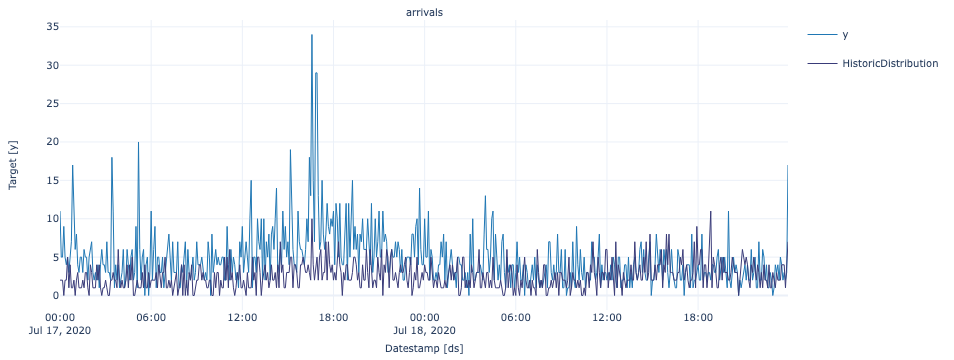

In [9]:
sf.plot(eval_test, models=['HistoricDistribution'])

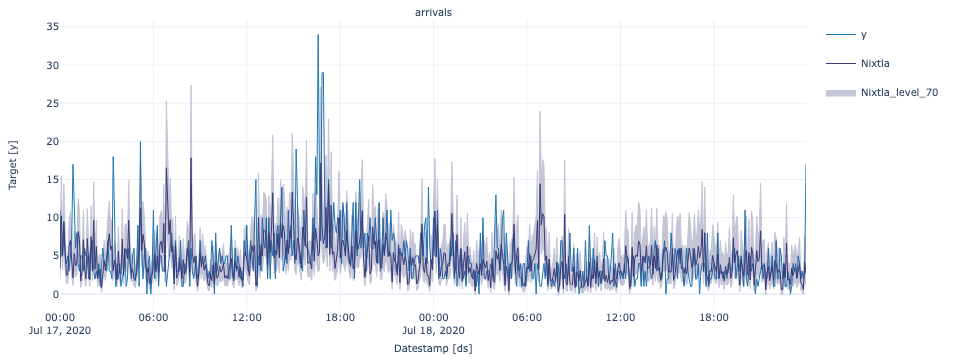

In [10]:
sf.plot(eval_test, models=['Nixtla'])

### Queue correlation

#### Actual Queue for the test set

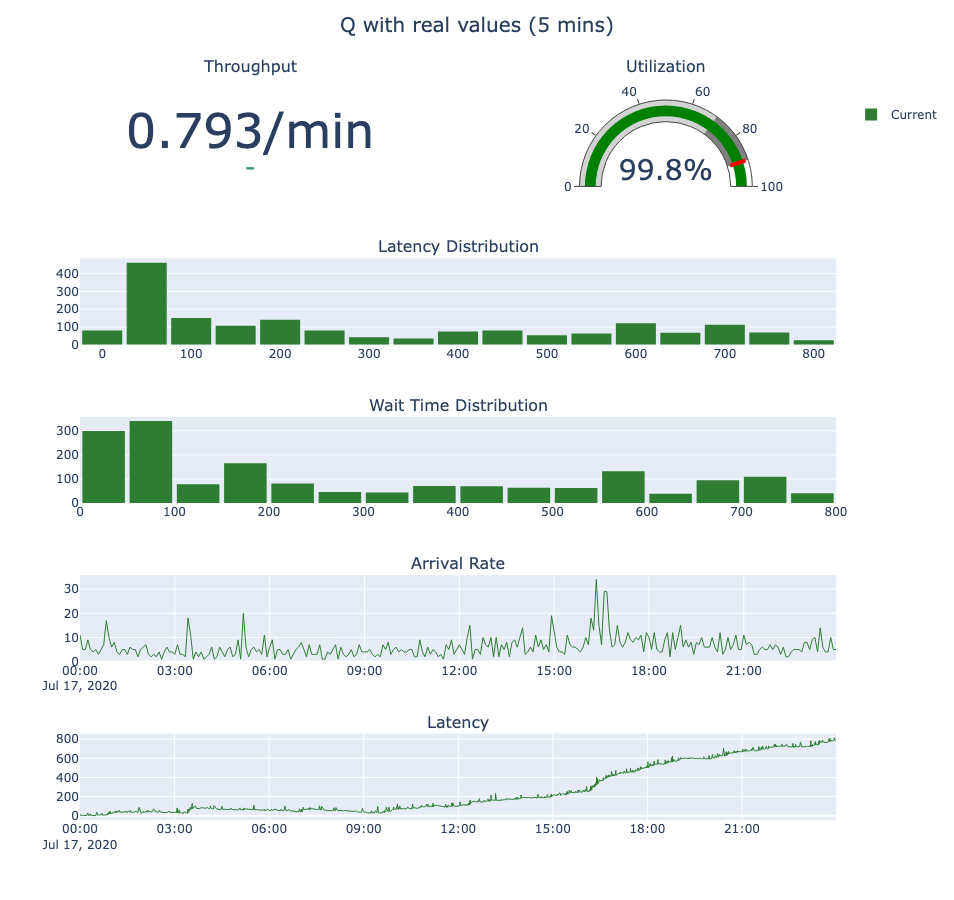

In [11]:
# assuming uniformity between 5 minutes
actual_times = [0.]
for count in test['y'].values:
    actual_times.extend([5 / count if count != 0 else 5 for _ in range(count)])
network = ciw.create_network(arrival_distributions=[ ciw.dists.Sequential(actual_times) ], 
                             service_distributions=[ 
                                     ServiceDistribution(
                                                     TIME_TO_TRIAGE,
                                                     TIME_TO_INVESTIGATE,
                                                     TIME_TO_REPORT) 
                                     ],
                             number_of_servers=[NUM_SOC_WORKERS]) 

Q_actual_sd = ciw.Simulation(network)
Q_actual_sd.simulate_until_max_customers(SIMULATION_CUST)
dashboard = build_dashboard(Q_actual_sd, title='Q with real values (5 mins)', test=test)
dashboard.show()

#### Queues Modeled by Historical Distribution 

In [12]:
network = ciw.create_network(arrival_distributions=[ HistoricalDistribution(train) ],
                             service_distributions=[ 
                                     ServiceDistribution(
                                                     TIME_TO_TRIAGE,
                                                     TIME_TO_INVESTIGATE,
                                                     TIME_TO_REPORT) 
                                     ],
                             number_of_servers=[ NUM_SOC_WORKERS ])

Q_basic_soc = ciw.Simulation(network)
Q_basic_soc.simulate_until_max_customers(SIMULATION_CUST)

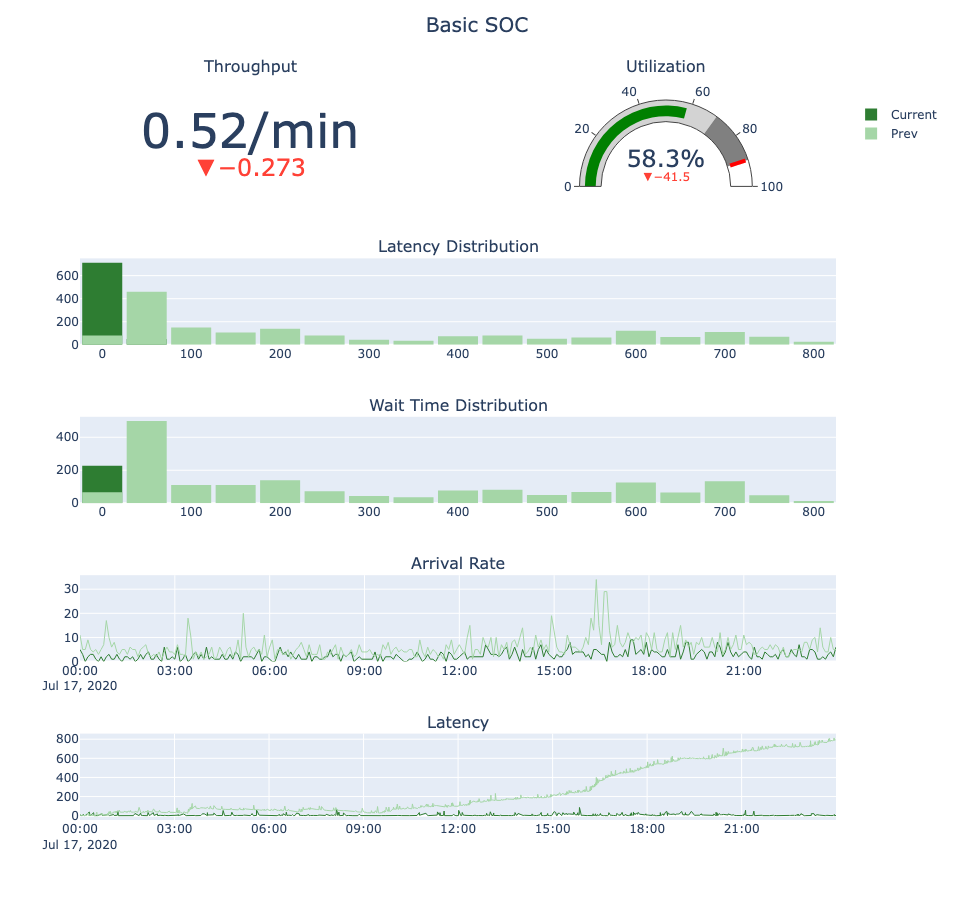

In [13]:
dashboard = build_dashboard(Q_basic_soc, prev_q=Q_actual_sd, title='Basic SOC', test=test)
dashboard.show()

#### Queues Modeled using Nixtla Forecasts

In [14]:
def simulate_using_forecasts(forecast_df, col='Nixtla', show_dashboard=True):
    forecast_times = [0.]
    for count in forecast_df[col].values:
        forecast_times.extend([5 / count if count != 0 else 5 for _ in range(int(np.floor(count)))])
    network = ciw.create_network(arrival_distributions=[ ciw.dists.Sequential(forecast_times) ], 
                                 service_distributions=[ 
                                         ServiceDistribution(
                                                         TIME_TO_TRIAGE,
                                                         TIME_TO_INVESTIGATE,
                                                         TIME_TO_REPORT) 
                                         ],
                                 number_of_servers=[NUM_SOC_WORKERS]) 

    Q_forecast = ciw.Simulation(network)
    Q_forecast.simulate_until_max_customers(SIMULATION_CUST)
    if show_dashboard:
        dashboard = build_dashboard(Q_forecast, prev_q=Q_actual_sd, title='Nixtla Forecast SOC', test=test)
        dashboard.show()
    return Q_forecast

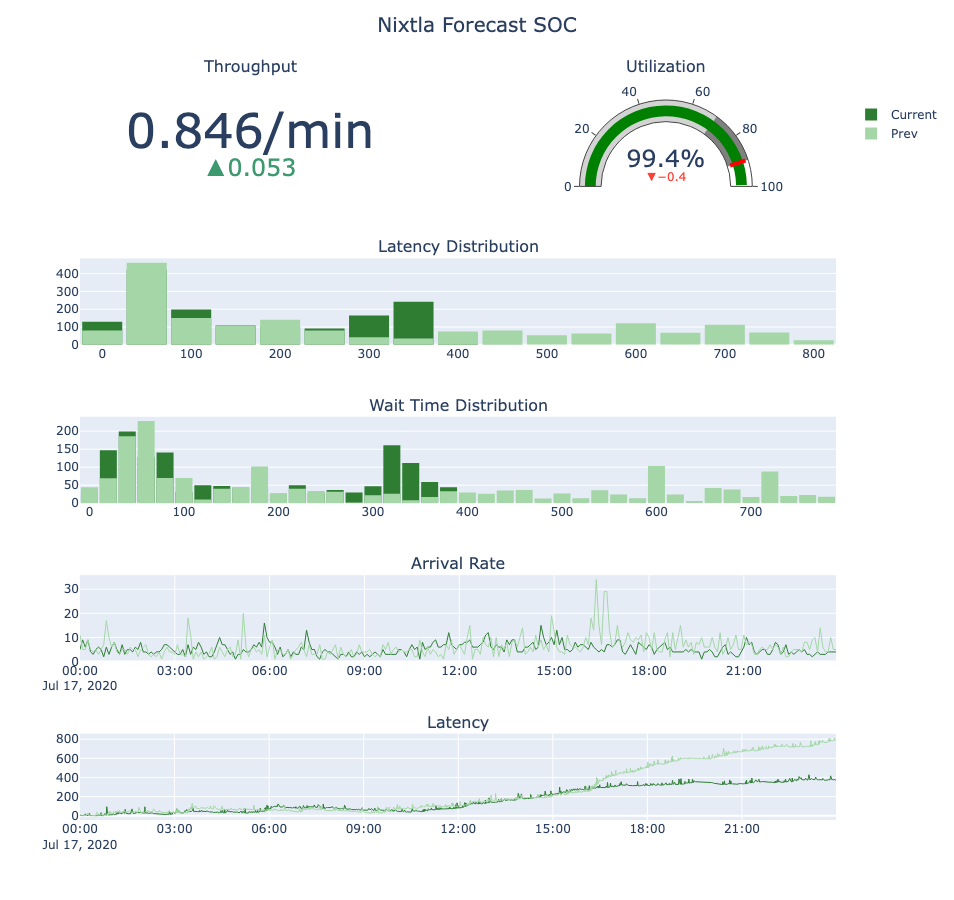

In [15]:
Q_nixtla = simulate_using_forecasts(fcst_nixtla)

#### Latency

In [16]:
lat_Q_actual_sd = get_latency_from_simulation(Q_actual_sd, test, 'ActualLatency')
lat_Q_basic_soc = get_latency_from_simulation(Q_basic_soc, test, 'HistoricDistribution')
lat_Q_nixtla = get_latency_from_simulation(Q_nixtla, test, 'Nixtla')
lat_Q_nixtla_lo = get_latency_from_simulation(simulate_using_forecasts(fcst_nixtla, 'Nixtla-lo-70', False), test, 'Nixtla-lo-70')
lat_Q_nixtla_hi = get_latency_from_simulation(simulate_using_forecasts(fcst_nixtla, 'Nixtla-hi-70', False), test, 'Nixtla-hi-70')
latencies = lat_Q_actual_sd.merge(lat_Q_basic_soc).merge(lat_Q_nixtla).merge(lat_Q_nixtla_lo).merge(lat_Q_nixtla_hi)
latencies.insert(0, 'unique_id', 'latency')

In [17]:
def diff_mean_latency(y, y_hat):
    return y.mean() - y_hat.mean()

In [18]:
evaluate_future(latencies, [mse, smape, pd.Series.corr, diff_mean_latency], target_col='ActualLatency')

,unique_id,metric,HistoricDistribution,Nixtla
0,latency,mse,9.724253e+06,5.292441e+06
1,latency,smape,1.870154e+02,6.820275e+01
2,latency,corr,1.579854e-01,5.367164e-01
3,latency,diff_mean_latency,2.054200e+03,1.084731e+03


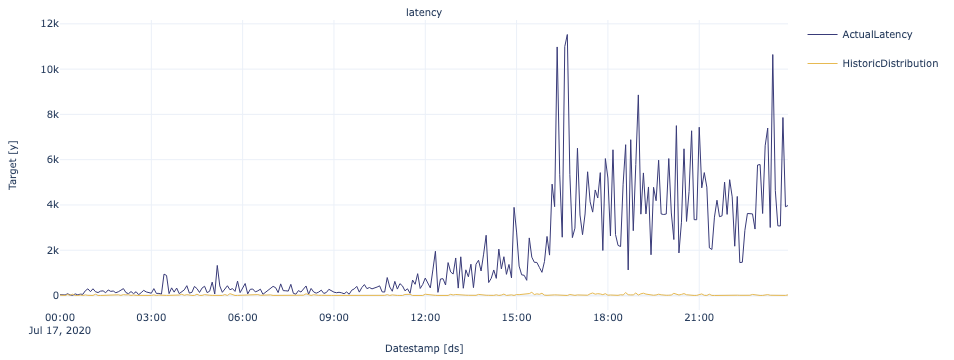

In [19]:
StatsForecast.plot(latencies.iloc[0:12*24], models=['ActualLatency', 'HistoricDistribution'])

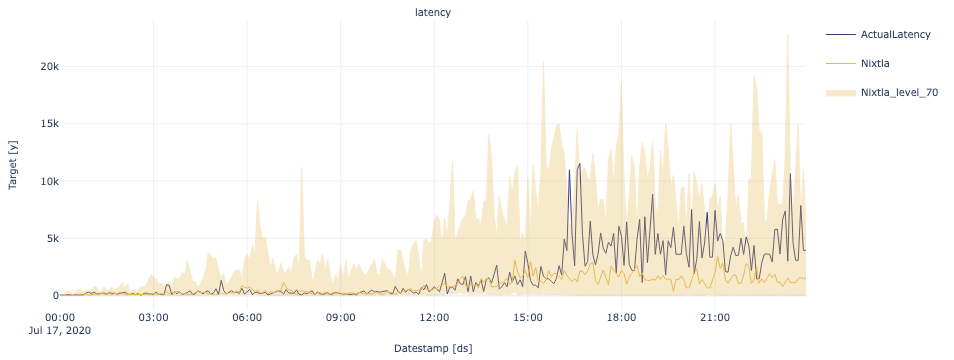

In [20]:
StatsForecast.plot(latencies.iloc[0:12*24], models=['ActualLatency', 'Nixtla'])

Conclusion:
    * Error de Latencia
    * Correlaciones
    * Latenca promedio del dia

Additioona features:
    * Probabilciist
    
    

## Data with trend

### Preparation

In [21]:
train_trend, test_trend = split_train_test(
    filename='arr_times.csv', 
    freq='5T', # 5 minutes intervals
    test_size=24 * 12 * 2, # 2 days as test set
    add_trend=True,
)

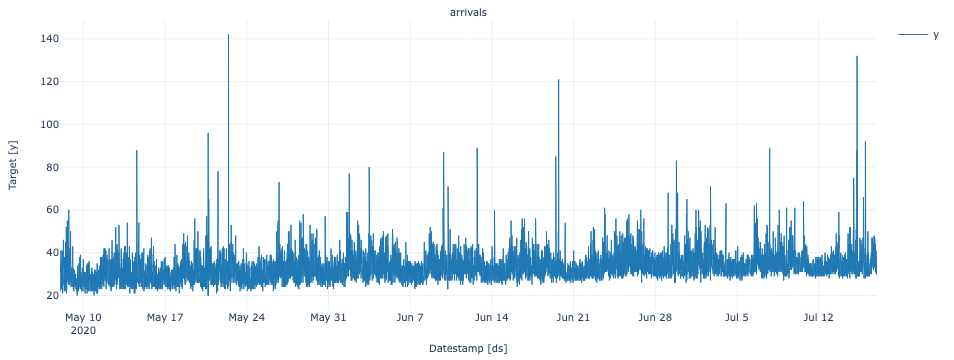

In [22]:
StatsForecast.plot(train_trend, max_insample_length=12 * 24 * 70)

### Historic Distribution

In [23]:
network = ciw.create_network(arrival_distributions=[ HistoricalDistribution(train_trend) ],
                             service_distributions=[ 
                                     ServiceDistribution(
                                                     TIME_TO_TRIAGE,
                                                     TIME_TO_INVESTIGATE,
                                                     TIME_TO_REPORT) 
                                     ],
                             number_of_servers=[ NUM_SOC_WORKERS ])

Q_basic_soc = ciw.Simulation(network)
Q_basic_soc.simulate_until_max_customers(SIMULATION_CUST_TREND)
fcst_Q_basic_soc = get_forecasts_from_simulation(Q_basic_soc, test, 'HistoricDistribution')

### Nixtla modeling

In [24]:
sf = StatsForecast(models=[MSTL(season_length=[12 * 24, 12 * 24 * 7], alias='Nixtla')], freq='5T')
fcst_nixtla = sf.forecast(
    df=train_trend.assign(y=lambda df: np.log(df['y'] + 1)), 
    h=len(test_trend),
    level=[70],
)

### Evaluation

In [25]:
cols = fcst_nixtla.reset_index().drop(columns=['unique_id', 'ds']).columns
for col in cols:
    fcst_nixtla[col] = np.exp(fcst_nixtla[col]) - 1

In [26]:
eval_test = test_trend.merge(fcst_Q_basic_soc, how='left', on=['ds'])
eval_test = eval_test.merge(fcst_nixtla, how='left', on=['ds'])

In [27]:
evaluation = evaluate_future(eval_test, [mse, smape])
evaluation['% Reduction'] = 100 * (evaluation['HistoricDistribution'] - evaluation['Nixtla']) / evaluation['HistoricDistribution']
evaluation

,unique_id,metric,HistoricDistribution,Nixtla,% Reduction
0,arrivals,mse,748.137153,22.594089,96.979954
1,arrivals,smape,133.832021,9.483314,92.914017


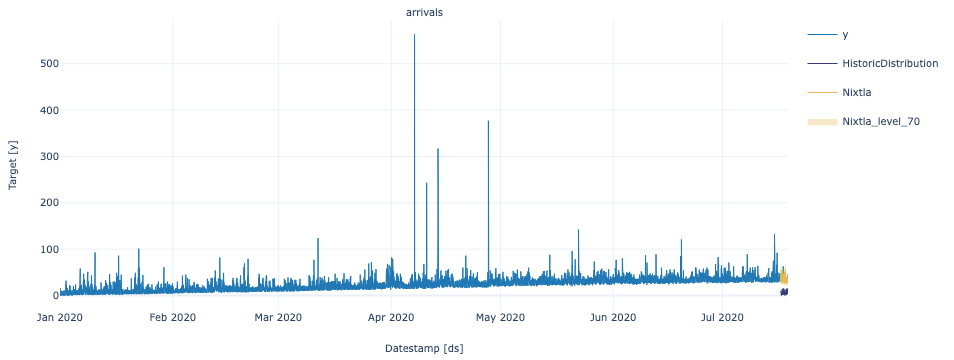

In [28]:
sf.plot(train_trend, eval_test, level=[70])

### Queue correlation

#### Actual Queue for the test set

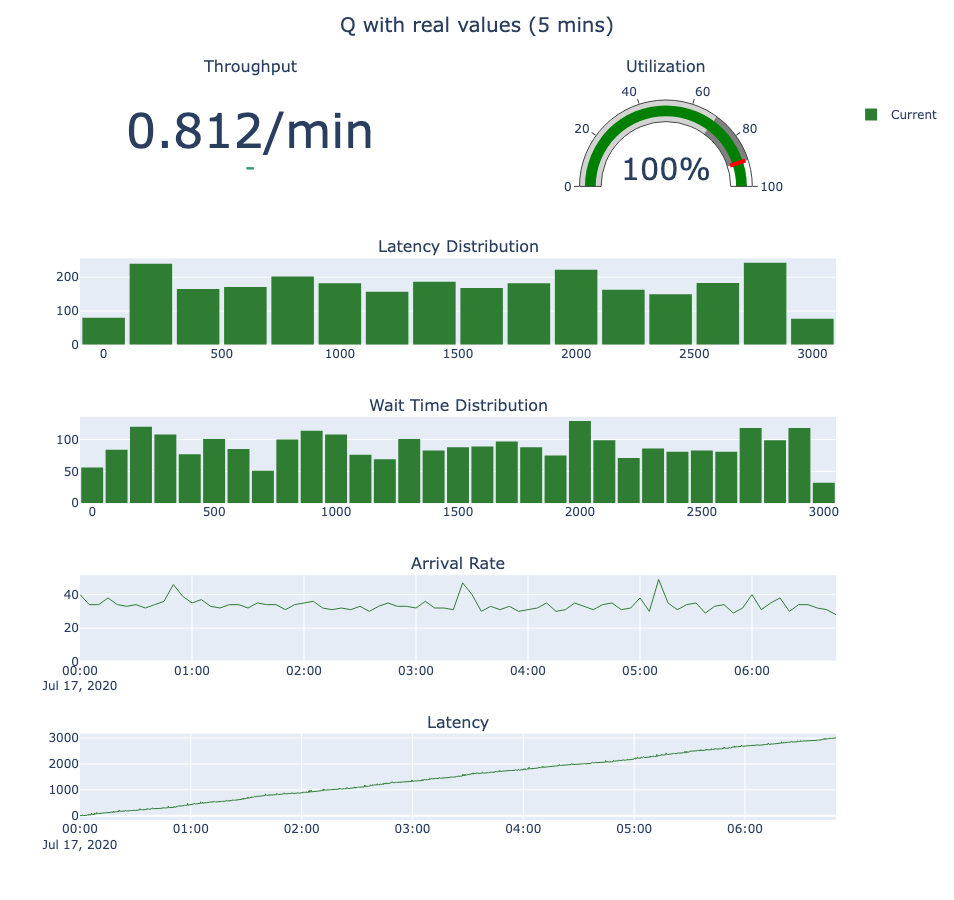

In [29]:
# assuming uniformity between 5 minutes
actual_times_trend = [0.]
for count in test_trend['y'].values:
    actual_times_trend.extend([5 / count if count != 0 else 5 for _ in range(int(count))])

network = ciw.create_network(arrival_distributions=[ ciw.dists.Sequential(actual_times_trend) ], 
                             service_distributions=[ 
                                     ServiceDistribution(
                                                     TIME_TO_TRIAGE,
                                                     TIME_TO_INVESTIGATE,
                                                     TIME_TO_REPORT) 
                                     ],
                             number_of_servers=[NUM_SOC_WORKERS]) 

Q_actual_sd = ciw.Simulation(network)
Q_actual_sd.simulate_until_max_customers(SIMULATION_CUST)
dashboard = build_dashboard(Q_actual_sd, title='Q with real values (5 mins)', test=test)
dashboard.show()

#### Queues Modeled by Historical Distribution 

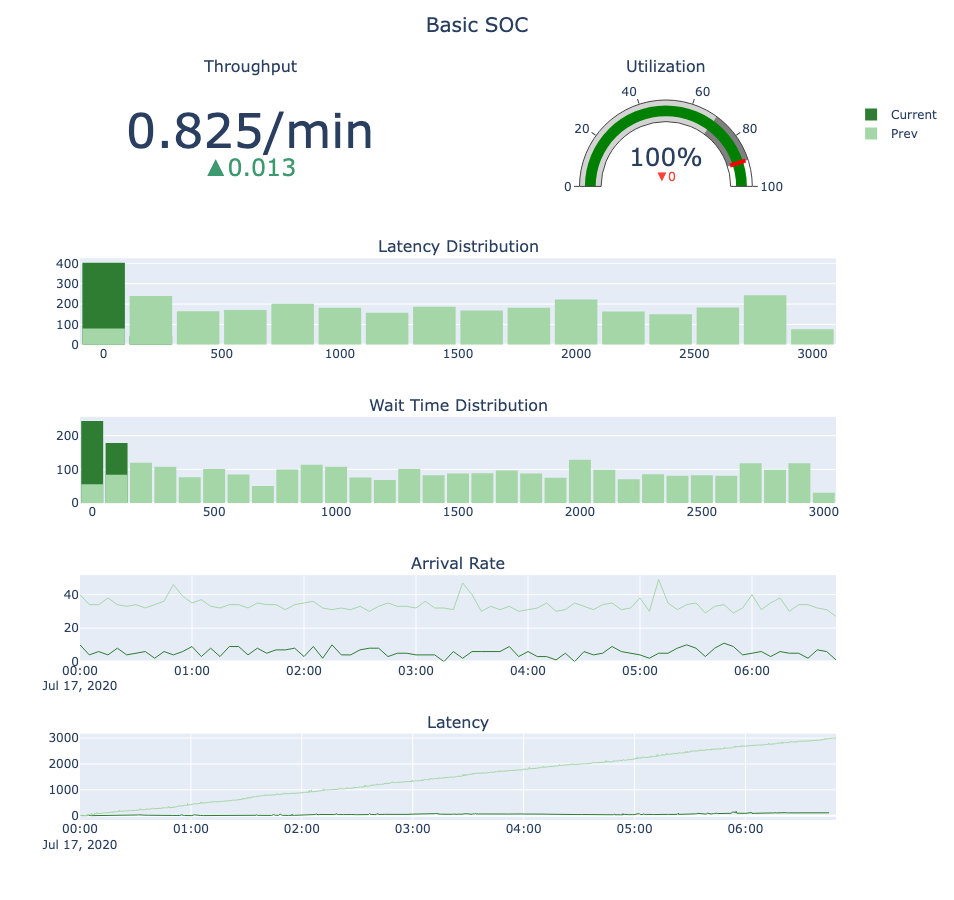

In [30]:
dashboard = build_dashboard(Q_basic_soc, prev_q=Q_actual_sd, title='Basic SOC', test=test)
dashboard.show()

#### Queues Modeled using Nixtla Forecasts

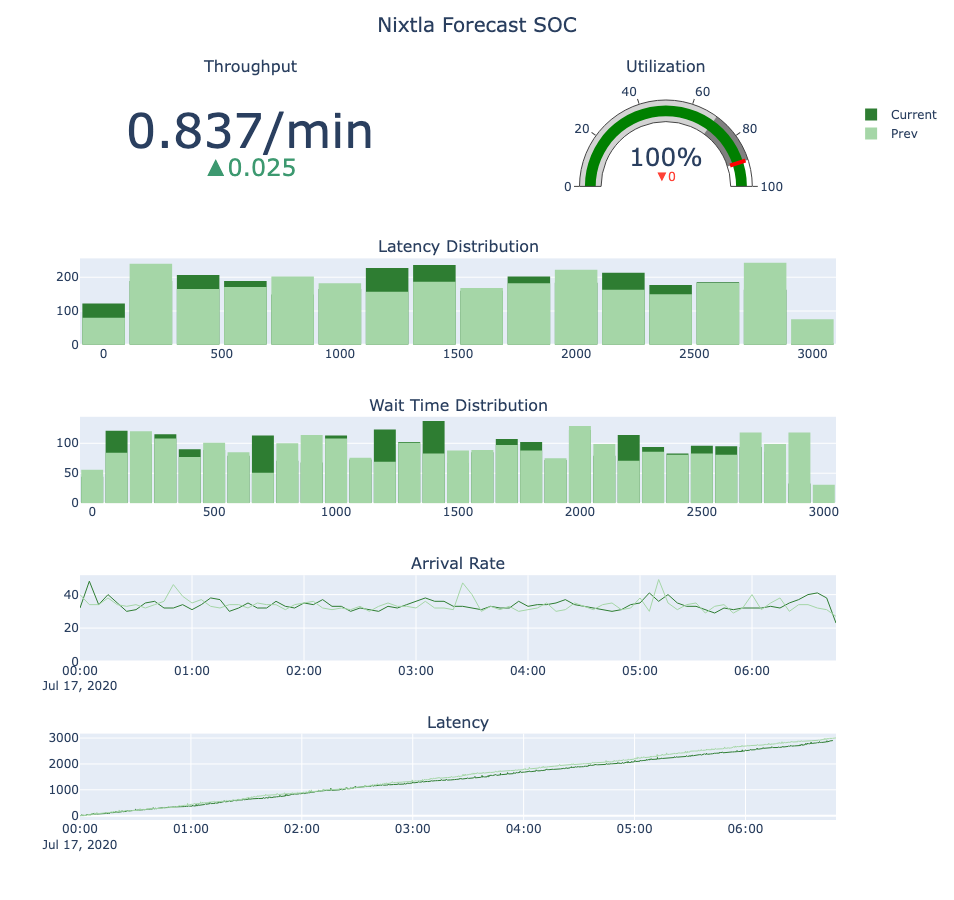

In [31]:
Q_nixtla = simulate_using_forecasts(fcst_nixtla)

#### Latency

In [32]:
lat_Q_actual_sd = get_latency_from_simulation(Q_actual_sd, test, 'ActualLatency')
lat_Q_basic_soc = get_latency_from_simulation(Q_basic_soc, test, 'HistoricDistribution')
lat_Q_nixtla = get_latency_from_simulation(Q_nixtla, test, 'Nixtla')
lat_Q_nixtla_lo = get_latency_from_simulation(simulate_using_forecasts(fcst_nixtla, 'Nixtla-lo-70', False), test, 'Nixtla-lo-70')
lat_Q_nixtla_hi = get_latency_from_simulation(simulate_using_forecasts(fcst_nixtla, 'Nixtla-hi-70', False), test, 'Nixtla-hi-70')
latencies = lat_Q_actual_sd.merge(lat_Q_basic_soc).merge(lat_Q_nixtla).merge(lat_Q_nixtla_lo).merge(lat_Q_nixtla_hi)
latencies.insert(0, 'unique_id', 'latency')

In [33]:
def diff_mean_latency(y, y_hat):
    return y.mean() - y_hat.mean()

In [34]:
evaluate_future(latencies, [mse, smape, pd.Series.corr, diff_mean_latency], target_col='ActualLatency')

,unique_id,metric,HistoricDistribution,Nixtla
0,latency,mse,2.416655e+09,5.454169e+07
1,latency,smape,1.972002e+02,1.104770e+01
2,latency,corr,5.594978e-01,9.607459e-01
3,latency,diff_mean_latency,4.218736e+04,2.227102e+03


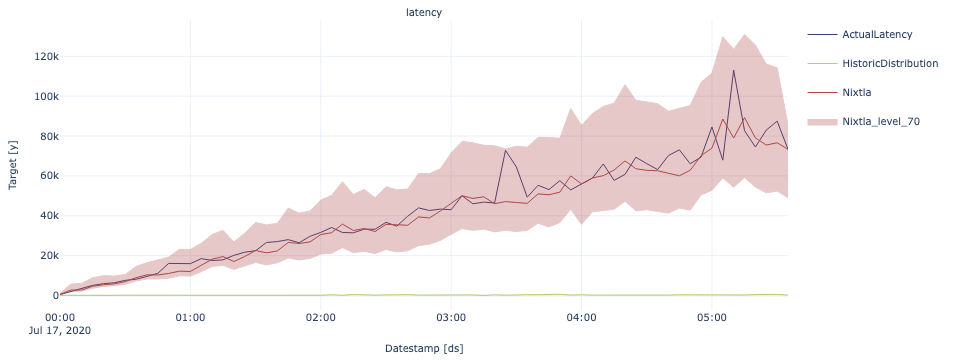

In [35]:
StatsForecast.plot(latencies.iloc[0:12*24])